<a href="https://colab.research.google.com/github/CRISTIANJULIOCESAR/2022-1-iimas-deep/blob/main/XGBOOST_GPU_shaps_last_cv_and_all_better_separation_V100_GPU.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

In [10]:
from google.colab import drive
drive.mount('/content/drive')

Drive already mounted at /content/drive; to attempt to forcibly remount, call drive.mount("/content/drive", force_remount=True).


In [11]:
!pip install shap==0.43.0 umap-learn==0.5.4

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 532.9/532.9 kB 7.6 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 90.8/90.8 kB 7.7 MB/s eta 0:00:00
  Preparing metadata (setup.py) ... done
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 1.1/1.1 MB 17.9 MB/s eta 0:00:00
  Preparing metadata (setup.py) ... done
  Created wheel for umap-learn: filename=umap_learn-0.5.4-py3-none-any.whl size=86770 sha256=b35b05ac521e9b3e379c6d0c6a2dba3e0d3d57d6d495ca1c99ee54cf5e908fc8
  Stored in directory: /root/.cache/pip/wheels/fb/66/29/199acf5784d0f7b8add6d466175ab45506c96e386ed5dd0633
  Created wheel for pynndescent: filename=pynndescent-0.5.10-py3-none-any.whl size=55615 sha256=4802a4a004e57e4e79e3140cf447932d346ffb6d0f611db56bd1ee583dd58353
  Stored in directory: /root/.cache/pip/wheels/4a/38/5d/f60a40a66a9512b7e5e83517ebc2d1b42d857be97d135f1096
Successfully built umap-learn pynndescent


#Only tumor wo normal(healthy) preprocessing

In [12]:
import shap
import pandas as pd
import numpy as np
df =  pd.read_pickle('/content/drive/MyDrive/pan_cancer_diner/Gene parsing  code /11093rx39979c.pkl')
meta= pd.read_pickle('/content/drive/MyDrive/pan_cancer_diner/Clinical data from  tcga.R/metadata.pkl')

In [13]:
meta.columns

Index(['Unnamed: 0', 'data_type', 'updated_datetime', 'file_name', 'md5sum',
       'data_category', 'experimental_strategy', 'project', 'sample_uuid',
       'sample_barcode', 'tumor', 'patient_barcode', 'gender', 'vital',
       'days_to_contact', 'days_to_death', 'days_to_birth', 'panel',
       'histology', 'tissue_site', 'stage', 'T', 'N', 'M', 'residual_tumor',
       'new_tumor_events', 'follow_ups'],
      dtype='object')

In [14]:
df

,5S_rRNA,5_8S_rRNA,7SK,A1BG,A1BG-AS1,A1CF,A2M,A2M-AS1,A2ML1,A2ML1-AS1,...,ZYG11A,ZYG11AP1,ZYG11B,ZYX,ZYXP1,ZZEF1,ZZZ3,hsa-mir-1253,hsa-mir-423,snoZ196
Unnamed: 0,,,,,,,,,,,,,,,,,,,,,
84fd87d4-9b47-4852-b45c-1f681a58832c,4,0,949,48,74,2,27981,15,288,0,...,1,0,1057,4318,0,973,924,0,0,1
2da36252-af74-4e0c-ae38-5f5fc6bdad6e,0,0,285,10,41,4,33182,80,586,0,...,0,0,3719,5613,0,10839,1977,0,0,2
20ef7e72-9b76-4a4f-985c-1c35503b3e86,0,0,82,2,20,0,14847,115,122,0,...,185,0,2622,6686,0,2412,2116,0,0,4
83acd71c-c12a-4394-ba8d-05e9c5ad2cf1,1,0,502,44,278,9,50129,139,26,1,...,531,0,6497,9902,0,7520,6272,0,0,0
04d7ee0b-95ce-4af2-8140-547e9c6bd187,2,0,612,6,84,3,31641,55,518,0,...,8,0,2446,11845,0,4063,2797,0,0,4
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
5d98ad4a-483f-4032-ae9e-0ab6d398da98,3,0,3455,81,216,1,23,4,10,0,...,2,0,907,28542,0,3221,1042,0,0,8
e0822da0-24d1-413a-b87f-5c6a242d3732,0,0,254,29,192,9,53226,74,38,1,...,126,0,2741,11978,0,5163,5026,0,0,5
3a74e5d3-48e7-4df9-85e1-dd02d1c804c1,1,0,95,135,674,0,41441,54,12,0,...,72,0,2296,27635,0,5424,2489,0,0,6


#Live is 0 Death is 1

In [15]:
df = df[meta['tumor'] == True]
df['vital']= meta['vital']
df =df.dropna()

Boolean Series key will be reindexed to match DataFrame index.

A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


In [16]:
df['vital'].unique()

array(['Alive', 'Dead'], dtype=object)

In [17]:
y = df['vital'].replace({'Alive': 1, 'Dead': 0})
y

Unnamed: 0
84fd87d4-9b47-4852-b45c-1f681a58832c    1
2da36252-af74-4e0c-ae38-5f5fc6bdad6e    1
83acd71c-c12a-4394-ba8d-05e9c5ad2cf1    1
04d7ee0b-95ce-4af2-8140-547e9c6bd187    1
171f45e7-83e7-4286-970a-0dafa6f46d8a    1
                                       ..
21ea6561-2bd1-4a3d-ae70-3c504530bb26    0
5d98ad4a-483f-4032-ae9e-0ab6d398da98    0
3a74e5d3-48e7-4df9-85e1-dd02d1c804c1    1
86fd69ec-fbe4-4ca7-a1a5-a42367527929    0
a811e4bd-d1d5-4a97-bc7f-899906c7f145    1
Name: vital, Length: 10339, dtype: int64

In [18]:
y.value_counts()


1    7251
0    3088
Name: vital, dtype: int64

In [19]:
import numpy as np
import pandas as pd
from xgboost import XGBClassifier
from sklearn.datasets import load_breast_cancer
from sklearn.model_selection import StratifiedKFold
from sklearn.metrics import roc_auc_score, roc_curve
import matplotlib.pyplot as plt

# Load sample data
#Without the columun named "vital"
X = np.log(df.iloc[:,:-1].values +1)
y = df['vital'].replace({'Alive': 1, 'Dead': 0})
y = y.values

# Cross-validation setup
n_folds = 5
skf = StratifiedKFold(n_splits=n_folds, shuffle=True, random_state=42)
aucs = []
"""
clf = XGBClassifier(
    n_estimators= 1000,
    learning_rate=0.01,
    max_depth=20,
    subsample=0.5,
    colsample_bytree=0.2,
    colsample_bylevel=0.2,
    gamma=2,
    reg_alpha=0.5,
    reg_lambda=2,
    eval_metric='auc',
    use_label_encoder=False,
    grow_policy='lossguide',
    verbosity=3,
    tree_method='gpu_hist',
    n_jobs=-1
)


"""
clf = XGBClassifier(
    n_estimators= 200,
    eval_metric='auc',
    verbosity=3,
    #tree_method='gpu_hist',
    random_state=50,
    grow_policy='lossguide',
    tree_method='gpu_hist',

)

StratifiedKFold is a variation of k-fold cross-validation that returns stratified folds. "Stratified" means that each fold is made by preserving the percentage of samples for each class. This is especially useful when you have an imbalanced dataset where one class significantly outnumbers the other(s).

[04:37:54] ======== Monitor (0): HostSketchContainer ========
[04:37:54] AllReduce: 1.4664s, 1 calls @ 1466398us

[04:37:54] MakeCuts: 1.61432s, 1 calls @ 1614323us

[04:37:54] DEBUG: /workspace/src/gbm/gbtree.cc:130: Using tree method: 5
[04:37:54] DEBUG: /workspace/src/tree/updater_gpu_hist.cu:744: [GPU Hist]: Configure


[04:37:54] WARNING: /workspace/src/common/error_msg.cc:27: The tree method `gpu_hist` is deprecated since 2.0.0. To use GPU training, set the `device` parameter to CUDA instead.

    E.g. tree_method = "hist", device = "cuda"



[04:37:55] ======== Monitor (0):  ========
[04:37:55] InitCompressedData: 0.008779s, 1 calls @ 8779us

[04:39:20] ======== Monitor (0): Learner ========
[04:39:20] Configure: 0.950335s, 1 calls @ 950335us

[04:39:20] EvalOneIter: 0.002429s, 200 calls @ 2429us

[04:39:20] GetGradient: 0.019996s, 200 calls @ 19996us

[04:39:20] PredictRaw: 0.000301s, 200 calls @ 301us

[04:39:20] UpdateOneIter: 86.6037s, 200 calls @ 86603717us

[04:39:20] ======== Monitor (0): GBTree ========
[04:39:20] BoostNewTrees: 85.6267s, 200 calls @ 85626735us

[04:39:20] CommitModel: 0.000176s, 200 calls @ 176us

[04:39:20] ======== Device 0 Memory Allocations:  ========
[04:39:20] Peak memory usage: 6813MiB
[04:39:20] Number of allocations: 37723
[04:39:20] ======== Monitor (0): updater_gpu_hist ========
[04:39:20] InitData: 0.000509s, 200 calls @ 509us

[04:39:20] InitDataOnce: 0.000464s, 1 calls @ 464us

[04:39:20] Update: 85.6174s, 200 calls @ 85617417us

[04:39:20] UpdatePredictionCache: 0.007038s, 200 calls

[04:39:20] WARNING: /workspace/src/common/error_msg.cc:27: The tree method `gpu_hist` is deprecated since 2.0.0. To use GPU training, set the `device` parameter to CUDA instead.

    E.g. tree_method = "hist", device = "cuda"

[04:39:20] WARNING: /workspace/src/common/error_msg.cc:58: Falling back to prediction using DMatrix due to mismatched devices. This might lead to higher memory usage and slower performance. XGBoost is running on: cuda:0, while the input data is on: cpu.
Potential solutions:
- Use a data structure that matches the device ordinal in the booster.
- Set the device for booster before call to inplace_predict.

This warning will only be shown once.



Classification Report for Fold 1:
              precision    recall  f1-score   support

           0       0.56      0.35      0.43       617
           1       0.76      0.88      0.82      1451

    accuracy                           0.72      2068
   macro avg       0.66      0.62      0.63      2068
weighted avg       0.70      0.72      0.70      2068

--------------------------------------------------
[04:39:42] ======== Monitor (0): HostSketchContainer ========
[04:39:42] AllReduce: 1.2811s, 1 calls @ 1281101us

[04:39:42] MakeCuts: 1.41092s, 1 calls @ 1410919us

[04:39:42] DEBUG: /workspace/src/gbm/gbtree.cc:130: Using tree method: 5
[04:39:42] DEBUG: /workspace/src/tree/updater_gpu_hist.cu:744: [GPU Hist]: Configure


[04:39:42] WARNING: /workspace/src/common/error_msg.cc:27: The tree method `gpu_hist` is deprecated since 2.0.0. To use GPU training, set the `device` parameter to CUDA instead.

    E.g. tree_method = "hist", device = "cuda"



[04:39:42] ======== Monitor (0):  ========
[04:39:42] InitCompressedData: 0.008911s, 1 calls @ 8911us

[04:41:10] ======== Monitor (0): Learner ========
[04:41:10] Configure: 0.001639s, 1 calls @ 1639us

[04:41:10] EvalOneIter: 0.002445s, 200 calls @ 2445us

[04:41:10] GetGradient: 0.020562s, 200 calls @ 20562us

[04:41:10] PredictRaw: 0.000311s, 200 calls @ 311us

[04:41:10] UpdateOneIter: 87.4689s, 200 calls @ 87468905us

[04:41:10] ======== Monitor (0): GBTree ========
[04:41:10] BoostNewTrees: 87.442s, 200 calls @ 87442049us

[04:41:10] CommitModel: 0.000178s, 200 calls @ 178us

[04:41:10] ======== Device 0 Memory Allocations:  ========
[04:41:10] Peak memory usage: 7754MiB
[04:41:10] Number of allocations: 76180
[04:41:10] ======== Monitor (0): updater_gpu_hist ========
[04:41:10] InitData: 0.000683s, 200 calls @ 683us

[04:41:10] InitDataOnce: 0.000638s, 1 calls @ 638us

[04:41:10] Update: 87.4329s, 200 calls @ 87432928us

[04:41:10] UpdatePredictionCache: 0.006907s, 200 calls @ 

[04:41:10] WARNING: /workspace/src/common/error_msg.cc:27: The tree method `gpu_hist` is deprecated since 2.0.0. To use GPU training, set the `device` parameter to CUDA instead.

    E.g. tree_method = "hist", device = "cuda"



Classification Report for Fold 2:
              precision    recall  f1-score   support

           0       0.64      0.40      0.50       618
           1       0.78      0.90      0.84      1450

    accuracy                           0.75      2068
   macro avg       0.71      0.65      0.67      2068
weighted avg       0.74      0.75      0.74      2068

--------------------------------------------------
[04:41:31] ======== Monitor (0): HostSketchContainer ========
[04:41:31] AllReduce: 1.25931s, 1 calls @ 1259307us

[04:41:31] MakeCuts: 1.39617s, 1 calls @ 1396169us

[04:41:31] DEBUG: /workspace/src/gbm/gbtree.cc:130: Using tree method: 5
[04:41:31] DEBUG: /workspace/src/tree/updater_gpu_hist.cu:744: [GPU Hist]: Configure


[04:41:31] WARNING: /workspace/src/common/error_msg.cc:27: The tree method `gpu_hist` is deprecated since 2.0.0. To use GPU training, set the `device` parameter to CUDA instead.

    E.g. tree_method = "hist", device = "cuda"



[04:41:31] ======== Monitor (0):  ========
[04:41:31] InitCompressedData: 0.008867s, 1 calls @ 8867us

[04:42:59] ======== Monitor (0): Learner ========
[04:42:59] Configure: 0.001905s, 1 calls @ 1905us

[04:42:59] EvalOneIter: 0.002428s, 200 calls @ 2428us

[04:42:59] GetGradient: 0.020391s, 200 calls @ 20391us

[04:42:59] PredictRaw: 0.000343s, 200 calls @ 343us

[04:42:59] UpdateOneIter: 87.5516s, 200 calls @ 87551636us

[04:42:59] ======== Monitor (0): GBTree ========
[04:42:59] BoostNewTrees: 87.5245s, 200 calls @ 87524499us

[04:42:59] CommitModel: 0.000173s, 200 calls @ 173us

[04:42:59] ======== Device 0 Memory Allocations:  ========
[04:42:59] Peak memory usage: 8679MiB
[04:42:59] Number of allocations: 114485
[04:42:59] ======== Monitor (0): updater_gpu_hist ========
[04:42:59] InitData: 0.000621s, 200 calls @ 621us

[04:42:59] InitDataOnce: 0.000576s, 1 calls @ 576us

[04:42:59] Update: 87.5154s, 200 calls @ 87515448us

[04:42:59] UpdatePredictionCache: 0.006775s, 200 calls 

[04:42:59] WARNING: /workspace/src/common/error_msg.cc:27: The tree method `gpu_hist` is deprecated since 2.0.0. To use GPU training, set the `device` parameter to CUDA instead.

    E.g. tree_method = "hist", device = "cuda"



Classification Report for Fold 3:
              precision    recall  f1-score   support

           0       0.59      0.42      0.49       618
           1       0.78      0.88      0.82      1450

    accuracy                           0.74      2068
   macro avg       0.68      0.65      0.66      2068
weighted avg       0.72      0.74      0.72      2068

--------------------------------------------------
[04:43:20] ======== Monitor (0): HostSketchContainer ========
[04:43:20] AllReduce: 1.20168s, 1 calls @ 1201676us

[04:43:20] MakeCuts: 1.30416s, 1 calls @ 1304162us

[04:43:20] DEBUG: /workspace/src/gbm/gbtree.cc:130: Using tree method: 5
[04:43:20] DEBUG: /workspace/src/tree/updater_gpu_hist.cu:744: [GPU Hist]: Configure


[04:43:20] WARNING: /workspace/src/common/error_msg.cc:27: The tree method `gpu_hist` is deprecated since 2.0.0. To use GPU training, set the `device` parameter to CUDA instead.

    E.g. tree_method = "hist", device = "cuda"



[04:43:20] ======== Monitor (0):  ========
[04:43:20] InitCompressedData: 0.008864s, 1 calls @ 8864us

[04:44:47] ======== Monitor (0): Learner ========
[04:44:47] Configure: 0.001663s, 1 calls @ 1663us

[04:44:47] EvalOneIter: 0.002451s, 200 calls @ 2451us

[04:44:47] GetGradient: 0.020165s, 200 calls @ 20165us

[04:44:47] PredictRaw: 0.000323s, 200 calls @ 323us

[04:44:47] UpdateOneIter: 86.8805s, 200 calls @ 86880472us

[04:44:47] ======== Monitor (0): GBTree ========
[04:44:47] BoostNewTrees: 86.854s, 200 calls @ 86853958us

[04:44:47] CommitModel: 0.000179s, 200 calls @ 179us

[04:44:47] ======== Device 0 Memory Allocations:  ========
[04:44:47] Peak memory usage: 9605MiB
[04:44:47] Number of allocations: 152390
[04:44:47] ======== Monitor (0): updater_gpu_hist ========
[04:44:47] InitData: 0.000685s, 200 calls @ 685us

[04:44:47] InitDataOnce: 0.000636s, 1 calls @ 636us

[04:44:47] Update: 86.8447s, 200 calls @ 86844663us

[04:44:47] UpdatePredictionCache: 0.007001s, 200 calls @

[04:44:47] WARNING: /workspace/src/common/error_msg.cc:27: The tree method `gpu_hist` is deprecated since 2.0.0. To use GPU training, set the `device` parameter to CUDA instead.

    E.g. tree_method = "hist", device = "cuda"



Classification Report for Fold 4:
              precision    recall  f1-score   support

           0       0.59      0.38      0.46       618
           1       0.77      0.88      0.82      1450

    accuracy                           0.74      2068
   macro avg       0.68      0.63      0.64      2068
weighted avg       0.72      0.74      0.72      2068

--------------------------------------------------
[04:45:09] ======== Monitor (0): HostSketchContainer ========
[04:45:09] AllReduce: 1.47212s, 1 calls @ 1472122us

[04:45:09] MakeCuts: 1.60413s, 1 calls @ 1604132us

[04:45:09] DEBUG: /workspace/src/gbm/gbtree.cc:130: Using tree method: 5
[04:45:09] DEBUG: /workspace/src/tree/updater_gpu_hist.cu:744: [GPU Hist]: Configure


[04:45:09] WARNING: /workspace/src/common/error_msg.cc:27: The tree method `gpu_hist` is deprecated since 2.0.0. To use GPU training, set the `device` parameter to CUDA instead.

    E.g. tree_method = "hist", device = "cuda"



[04:45:09] ======== Monitor (0):  ========
[04:45:09] InitCompressedData: 0.008892s, 1 calls @ 8892us

[04:46:36] ======== Monitor (0): Learner ========
[04:46:36] Configure: 0.002108s, 1 calls @ 2108us

[04:46:36] EvalOneIter: 0.002405s, 200 calls @ 2405us

[04:46:36] GetGradient: 0.020194s, 200 calls @ 20194us

[04:46:36] PredictRaw: 0.00031s, 200 calls @ 310us

[04:46:36] UpdateOneIter: 86.9818s, 200 calls @ 86981818us

[04:46:36] ======== Monitor (0): GBTree ========
[04:46:36] BoostNewTrees: 86.9548s, 200 calls @ 86954833us

[04:46:36] CommitModel: 0.000177s, 200 calls @ 177us

[04:46:36] ======== Device 0 Memory Allocations:  ========
[04:46:36] Peak memory usage: 10537MiB
[04:46:36] Number of allocations: 190271
[04:46:36] ======== Monitor (0): updater_gpu_hist ========
[04:46:36] InitData: 0.000683s, 200 calls @ 683us

[04:46:36] InitDataOnce: 0.000627s, 1 calls @ 627us

[04:46:36] Update: 86.9456s, 200 calls @ 86945587us

[04:46:36] UpdatePredictionCache: 0.006818s, 200 calls 

[04:46:36] WARNING: /workspace/src/common/error_msg.cc:27: The tree method `gpu_hist` is deprecated since 2.0.0. To use GPU training, set the `device` parameter to CUDA instead.

    E.g. tree_method = "hist", device = "cuda"



Classification Report for Fold 5:
              precision    recall  f1-score   support

           0       0.58      0.37      0.46       617
           1       0.77      0.89      0.82      1450

    accuracy                           0.73      2067
   macro avg       0.68      0.63      0.64      2067
weighted avg       0.71      0.73      0.71      2067

--------------------------------------------------


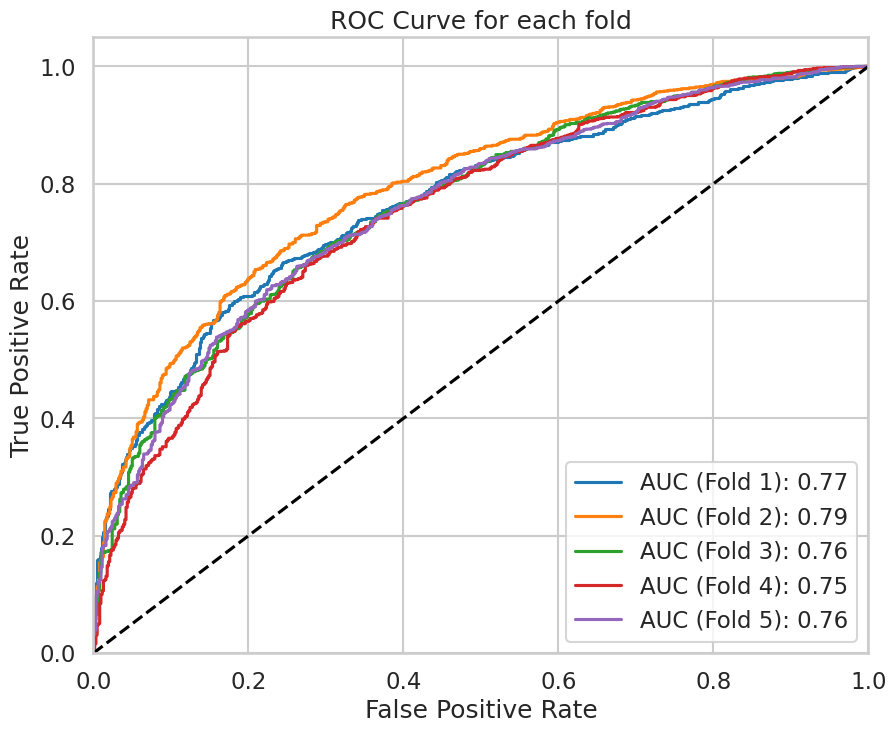

Mean AUC: 0.77
Std AUC: 0.01


<Figure size 640x480 with 0 Axes>

In [20]:
# Create a figure for the ROC curves
plt.figure(figsize=(10, 8))
from sklearn.metrics import roc_curve, roc_auc_score, classification_report
for train_index, test_index in skf.split(X, y):
    X_train, X_test = X[train_index], X[test_index]
    y_train, y_test = y[train_index], y[test_index]

    clf.fit(X_train, y_train)

    # Predict the class labels
    y_pred_class = clf.predict(X_test)

    # Print the classification report for this fold
    print(f"Classification Report for Fold {len(aucs) + 1}:")
    print(classification_report(y_test, y_pred_class))
    print("-" * 50)  # For visual separation between reports

    # Predict the probability of positive class
    y_pred = clf.predict_proba(X_test)[:, 1]

    # Compute and store AUC for the fold
    auc = roc_auc_score(y_test, y_pred)
    aucs.append(auc)

    # Compute ROC curve and plot
    fpr, tpr, _ = roc_curve(y_test, y_pred)
    plt.plot(fpr, tpr, label=f'AUC (Fold {len(aucs)}): {auc:.2f}')

# Plotting the ROC curves
plt.plot([0, 1], [0, 1], 'k--')
plt.xlim([0.0, 1.0])
plt.ylim([0.0, 1.05])
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.title('ROC Curve for each fold')
plt.legend(loc="lower right")
plt.show()
plt.savefig("ROC.png", dpi=600)  # dpi can be adjusted based on desired resolution

# Reporting average and standard deviation of AUC
print(f"Mean AUC: {np.mean(aucs):.2f}")
print(f"Std AUC: {np.std(aucs):.2f}")

In [21]:
clf

XGBClassifier(base_score=None, booster=None, callbacks=None,
              colsample_bylevel=None, colsample_bynode=None,
              colsample_bytree=None, device=None, early_stopping_rounds=None,
              enable_categorical=False, eval_metric='auc', feature_types=None,
              gamma=None, grow_policy='lossguide', importance_type=None,
              interaction_constraints=None, learning_rate=None, max_bin=None,
              max_cat_threshold=None, max_cat_to_onehot=None,
              max_delta_step=None, max_depth=None, max_leaves=None,
              min_child_weight=None, missing=nan, monotone_constraints=None,
              multi_strategy=None, n_estimators=200, n_jobs=None,
              num_parallel_tree=None, random_state=50, ...)

**WITH ALL DATA** SHAPS

In [22]:
import numpy as np
import pandas as pd
from xgboost import XGBClassifier
from sklearn.datasets import load_breast_cancer
from sklearn.model_selection import StratifiedKFold
from sklearn.metrics import roc_auc_score, roc_curve
import matplotlib.pyplot as plt

# Load sample data
#Without the columun named "vital"
X = np.log(df.iloc[:,:-1].values +1)
y = df['vital'].replace({'Alive': 1, 'Dead': 0})
y = y.values


In [81]:
clf = XGBClassifier(
    n_estimators= 10000,
    eval_metric='auc',
    verbosity=3,
    #tree_method='gpu_hist',
    random_state=50,
    grow_policy='lossguide',
    tree_method='gpu_hist',

)

In [82]:
# Let's compute SHAP values for the last test set after the final cross-validation loop
explainer = shap.TreeExplainer(clf.fit(X,y))

[06:24:58] ======== Monitor (0): HostSketchContainer ========
[06:24:58] AllReduce: 1.58662s, 1 calls @ 1586622us

[06:24:58] MakeCuts: 1.70259s, 1 calls @ 1702593us

[06:24:58] DEBUG: /workspace/src/gbm/gbtree.cc:130: Using tree method: 5
[06:24:58] DEBUG: /workspace/src/tree/updater_gpu_hist.cu:744: [GPU Hist]: Configure


/usr/local/lib/python3.10/dist-packages/xgboost/core.py:160: UserWarning:

[06:24:58] WARNING: /workspace/src/common/error_msg.cc:27: The tree method `gpu_hist` is deprecated since 2.0.0. To use GPU training, set the `device` parameter to CUDA instead.

    E.g. tree_method = "hist", device = "cuda"




[06:24:58] ======== Monitor (0):  ========
[06:24:58] InitCompressedData: 0.010995s, 1 calls @ 10995us

[06:44:22] ======== Monitor (0): Learner ========
[06:44:22] Configure: 0.002047s, 1 calls @ 2047us

[06:44:22] EvalOneIter: 0.109625s, 10000 calls @ 109625us

[06:44:22] GetGradient: 1.10119s, 10000 calls @ 1101195us

[06:44:22] PredictRaw: 0.012808s, 10000 calls @ 12808us

[06:44:22] UpdateOneIter: 1162.09s, 10000 calls @ 1162086037us

[06:44:22] ======== Monitor (0): GBTree ========
[06:44:22] BoostNewTrees: 1160.81s, 10000 calls @ 1160809053us

[06:44:22] CommitModel: 0.00976s, 10000 calls @ 9760us

[06:44:22] ======== Device 0 Memory Allocations:  ========
[06:44:22] Peak memory usage: 12880MiB
[06:44:22] Number of allocations: 532068
[06:44:22] ======== Monitor (0): updater_gpu_hist ========
[06:44:22] InitData: 0.003954s, 10000 calls @ 3954us

[06:44:22] InitDataOnce: 0.001876s, 1 calls @ 1876us

[06:44:22] Update: 1160.38s, 10000 calls @ 1160384320us

[06:44:22] UpdatePredict

/usr/local/lib/python3.10/dist-packages/xgboost/core.py:160: UserWarning:

[06:44:22] WARNING: /workspace/src/common/error_msg.cc:27: The tree method `gpu_hist` is deprecated since 2.0.0. To use GPU training, set the `device` parameter to CUDA instead.

    E.g. tree_method = "hist", device = "cuda"


/usr/local/lib/python3.10/dist-packages/xgboost/core.py:160: UserWarning:

[06:44:22] WARNING: /workspace/src/c_api/c_api.cc:1240: Saving into deprecated binary model format, please consider using `json` or `ubj`. Model format will default to JSON in XGBoost 2.2 if not specified.



In [85]:
shap_values = explainer.shap_values(X)

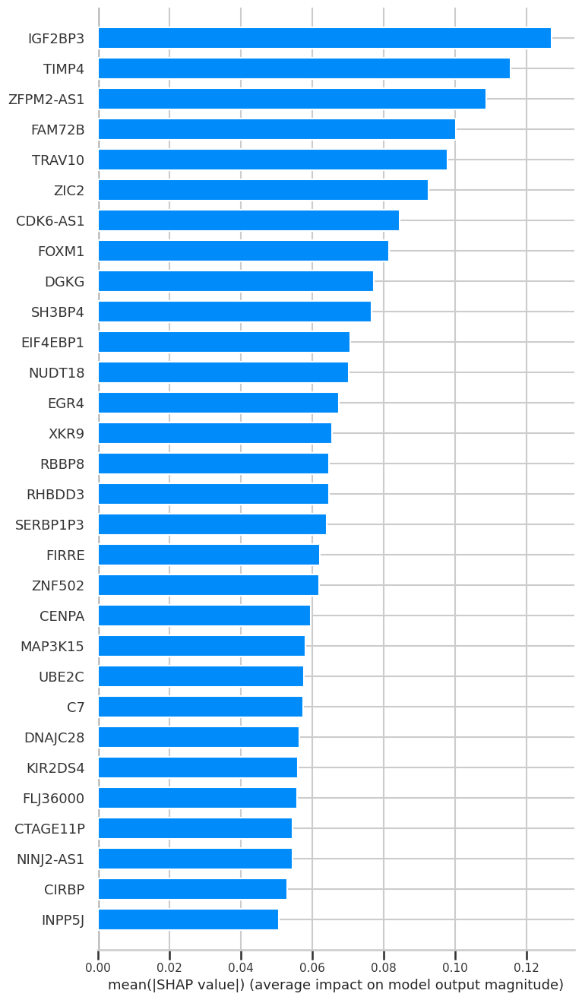

<Figure size 640x480 with 0 Axes>

In [27]:
import matplotlib
#matplotlib.use('Agg')

import shap
import matplotlib.pyplot as plt
import shap
import matplotlib.pyplot as plt

# Set up a figure
fig, ax = plt.subplots(figsize=(10, 6))

# Generate the SHAP plot
shap.summary_plot(shap_values, df.iloc[:,:-1], plot_type="bar", max_display=30)

# Save and display
plt.tight_layout()
plt.show()



In [88]:
import numpy as np
import pandas as pd
import plotly.express as px

# Asumiendo que shap_values es tu matriz de valores SHAP y ya tienes un DataFrame de pandas df y meta definidos.
shap_df = pd.DataFrame(shap_values, columns=df.columns[:-1], index=df.index)

# Agregar la variable "panel" del DataFrame "meta" al DataFrame SHAP
shap_df["panel"] = meta['panel']

# Calcular valores SHAP absolutos para obtener importancias de características
shap_importances = np.abs(shap_df.iloc[:, :-1]).mean(axis=0)
top = 30

# Obtener los índices de las características principales basadas en sus importancias
top_feature_indices = np.argsort(shap_importances)[-top:]

# Seleccionar las características principales según sus índices
top_features = shap_df.columns[top_feature_indices]

# Derretir el DataFrame para la representación basada en tonos
melted_shap_df = pd.melt(shap_df, id_vars=["panel"], value_vars=top_features, var_name="variable")

# Ordena melted_shap_df por 'variable' y luego por 'panel' para que el orden de los plots coincida con el orden alfabético de las etiquetas
sorted_panels = sorted(melted_shap_df['panel'].unique())
melted_shap_df['panel'] = pd.Categorical(melted_shap_df['panel'], categories=sorted_panels, ordered=True)

# Ahora, ordena por variable y por el orden del panel
melted_shap_df = melted_shap_df.sort_values(by=['variable', 'panel'])

# Crear un diagrama de caja con Plotly
fig = px.box(
    melted_shap_df,
    x="value",
    y="variable",
    color="panel",
    title="Top 5 SHAP Values by Panel",
    labels={"value": "SHAP Value", "variable": "Feature", "panel": "Panel"},
    orientation="h",
    category_orders={"variable": top_features.tolist()}
)

# Agregar línea vertical en x=0
fig.add_shape(
    type='line',
    line=dict(
        dash='dash',
    ),
    x0=0,
    x1=0,
    y0=-0.5,
    y1=top - 0.5
)

fig.update_layout(
    xaxis_title="SHAP Value",
    yaxis_title="Feature",
    boxmode='group',
    margin=dict(l=0, r=0, t=30, b=0)
)

fig.show()

# Guardar la figura en un archivo HTML
fig.write_html("shap_summary_plotly.html")



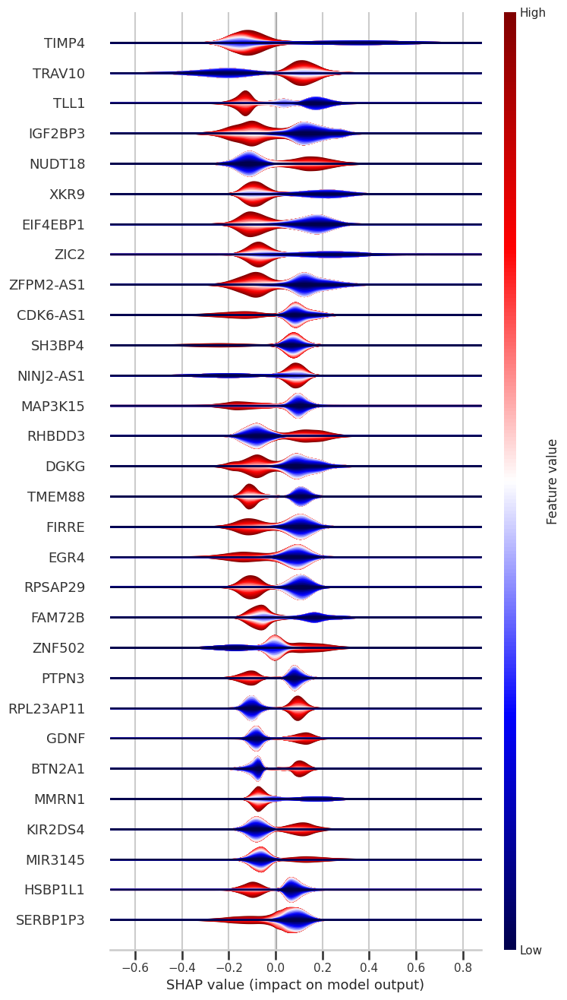

In [89]:

import matplotlib

import shap
import matplotlib.pyplot as plt
import shap
import matplotlib.pyplot as plt

# Set up a figure
fig, ax = plt.subplots(figsize=(10, 4))

# Generate the SHAP plot
shap.summary_plot(shap_values, np.log(df.iloc[:, :-1] +1), plot_type="layered_violin", max_display=30, color='seismic', show=False)
#seismic coolwarm
# Save and display
plt.tight_layout()
plt.savefig("shap_summary_plot_layered.png", dpi=600)  # dpi can be adjusted based on desired resolution

plt.show()


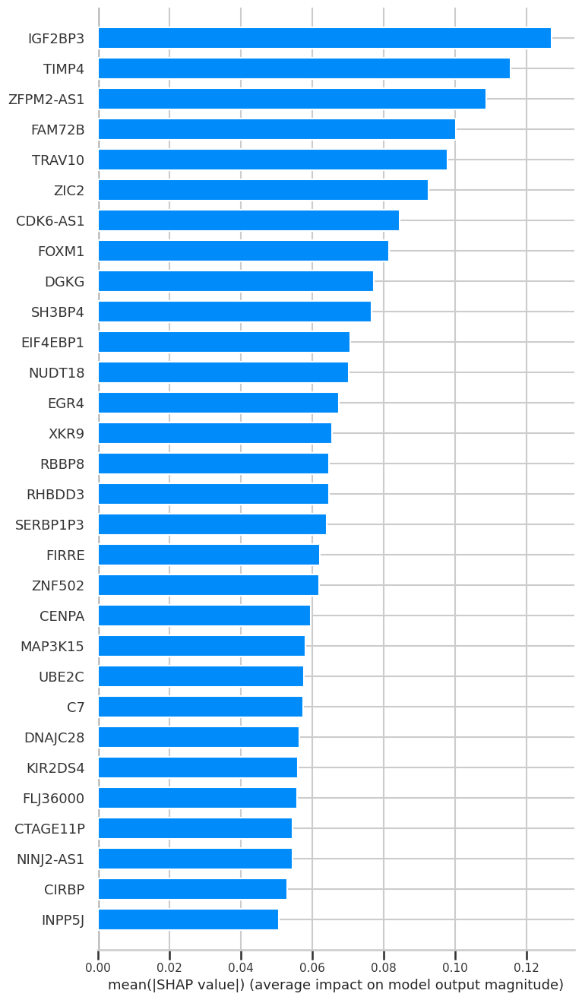

<Figure size 640x480 with 0 Axes>

<Figure size 640x480 with 0 Axes>

In [68]:

import matplotlib


import shap
import matplotlib.pyplot as plt
import shap
import matplotlib.pyplot as plt

# Set up a figure
fig, ax = plt.subplots(figsize=(10, 6))

# Generate the SHAP plot
shap.summary_plot(shap_values, df.iloc[:,:-1], plot_type="bar", max_display=30)

# Save and display
plt.tight_layout()
plt.show()
plt.savefig("shap_summary_plot_bar.png", dpi=600)  # dpi can be adjusted based on desired resolution

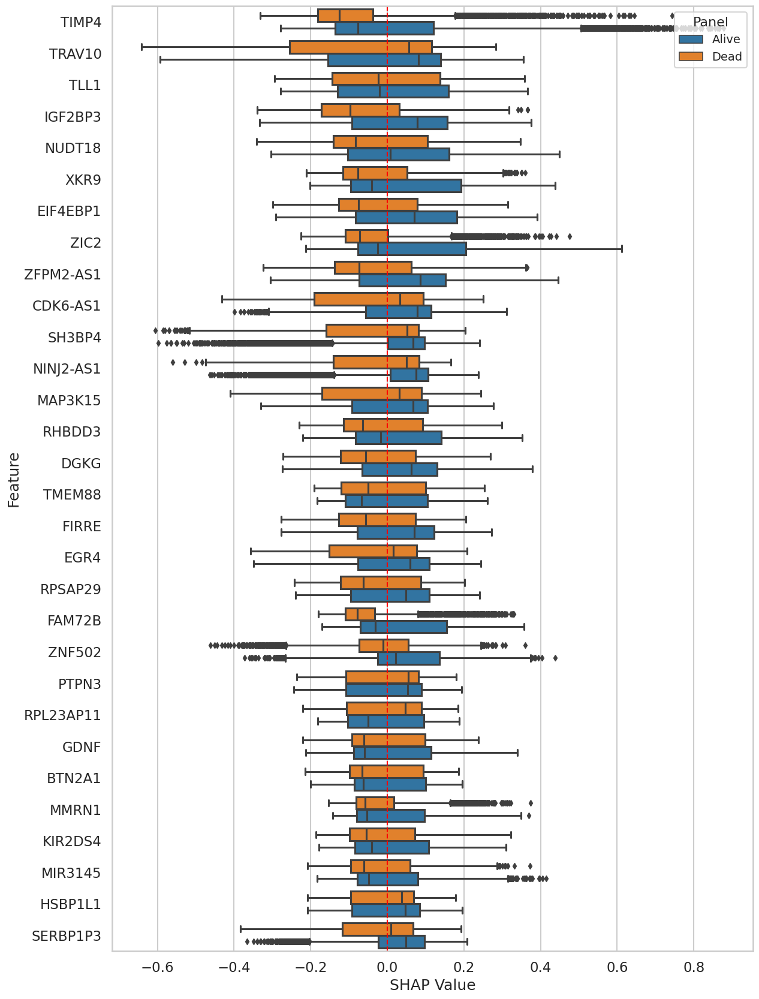

In [90]:
import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt
import numpy as np

# Set the style and context for the plot
sns.set_style("whitegrid")
sns.set_context("talk")

# Assuming shap_values_1 is your SHAP values matrix
# You can create a DataFrame to make it easier to work with
shap_df = pd.DataFrame(shap_values, columns=df.columns[:-1], index=df.index)

# Add the "panel" variable from the "meta" DataFrame to the SHAP DataFrame
shap_df["panel"] = meta['vital']

# Calculate absolute SHAP values to get feature importances
shap_importances = np.abs(shap_df.iloc[:, :-1]).mean(axis=0)
top = 30

# Get the indices of the top features based on their importances
top_feature_indices = np.argsort(shap_importances)[-top:]

# Select the top features based on their indices
top_features = shap_df.columns[top_feature_indices]

# Melt the DataFrame for hue-based plotting
melted_shap_df = pd.melt(shap_df, id_vars=["panel"], value_vars=top_features, var_name="variable")

# Set up the figure and axes
fig, ax = plt.subplots(figsize=(13, 17))

# Use sns.boxplot directly on the ax object with color referenced from your provided code
sns.boxplot(
    data=melted_shap_df, x="value", y="variable", hue="panel", ax=ax
)

# Add the red dotted line at x=0
ax.axvline(0, color='red', linestyle='--', linewidth=1.5)

# Invert the Y axis so the most important features are at the top
ax.invert_yaxis()

# Customize title and labels for better aesthetics
ax.set_xlabel("SHAP Value")
ax.set_ylabel("Feature")

# Add a legend and adjust its appearance
ax.legend(title="Panel", title_fontsize='16', loc="upper right", fontsize='14')

plt.tight_layout()

# Save and display the figure
plt.savefig("shap_vital_box.png", dpi=600, bbox_inches='tight')
plt.show()


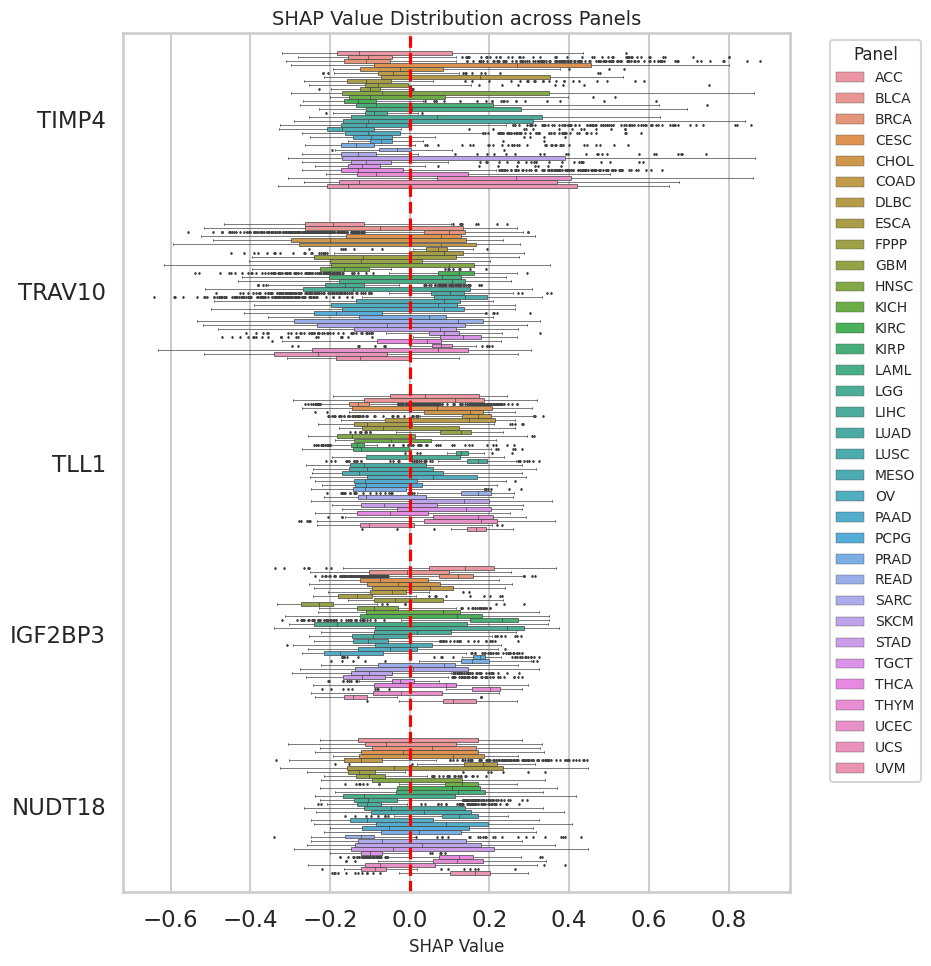

In [91]:
import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt

# Set the style and context for the plot
sns.set_style("whitegrid")
sns.set_context("talk")

# Suponiendo que shap_values_1 es tu matriz de valores SHAP
# Puedes crear un DataFrame para facilitar su manipulación
shap_df = pd.DataFrame(shap_values, columns=df.columns[:-1], index=df.index)

# Añadir la variable "panel" del DataFrame "meta" al DataFrame SHAP
shap_df["panel"] = meta['panel']

# Calcular valores SHAP absolutos para obtener importancias de características
shap_importances = np.abs(shap_df.iloc[:, :-1]).mean(axis=0)
top = 5
# Obtener los índices de las características principales según su importancia
top_feature_indices = np.argsort(shap_importances)[-top:]

# Seleccionar las características principales según sus índices
top_features = shap_df.columns[top_feature_indices]

# Crear un gráfico boxen más grande con colores consistentes identificando el panel
plt.figure(figsize=(10, 10))
melted_shap_df = pd.melt(shap_df, id_vars=["panel"], value_vars=top_features[::-1], var_name="variable")

sns.boxplot(
    data=melted_shap_df, x="value", y="variable", hue="panel",
    hue_order=sorted(melted_shap_df['panel'].unique()),
    orient="h", dodge=True, fliersize=1,linewidth=0.5
)

# Añadir la línea roja punteada en x=0
plt.axvline(0, color='red', linestyle='--')

# Establecer las etiquetas y el título con tamaños ajustados
plt.xlabel("SHAP Value", fontsize=12)
plt.title("SHAP Value Distribution across Panels", fontsize=14)

# Mover la leyenda fuera del área del gráfico, ajustar su tamaño y orientación
plt.legend(title="Panel", bbox_to_anchor=(1.05, 1), loc='upper left', fontsize=10, title_fontsize=12)

# Ajuste apretado para garantizar una visualización adecuada del gráfico
plt.tight_layout()
plt.ylabel("")
# Guardar el gráfico con una resolución alta
plt.savefig("shap_panel_box.png", dpi=600, bbox_inches='tight')

# Mostrar el gráfico
plt.show()


In [ ]:
save = pd.DataFrame(shap_values, columns= df.iloc[:,:-1].columns, index= df.iloc[:,:-1].index)

In [ ]:
save

In [ ]:
save.to_pickle("/content/drive/MyDrive/pan_cancer_diner/XGBOOST all shap files/shap_1.pkl")